# Data Exploration

Notebook for data exploration :
* Quick analyze of the entire dataset
* Specific analysis of the different features available

# 1. Imports

## 1.1 Packages

In [1]:
import datetime
import os
import pandas as pd
import sys

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import statsmodels.api as sm

In [2]:
sys.path.append("../src/")
from prepare_data import set_type, split_train_test
from feature_engineering import extract_date_features, add_lockdown_periods, add_holidays_period

## 1.2 Options

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
path_data = '../data/raw/'

feat_date = "Date"

## 1.3 Datasets

In [5]:
df = pd.read_csv(os.path.join(path_data, "dataset.gz"), sep=";")
df.sample(5)

,Date,Fourni,Ventes,id
19168,2020-08-30,3.0,1.0,7245864798564237029
15805,2020-07-15,22.0,22.0,4924687321366547844
48394,2021-10-26,10.0,4.0,-3727119720899292734
4942,2020-02-26,13.0,9.0,1129067540243158717
70021,2022-09-23,18.0,16.0,5218656160002569335


# 2. Analyze

In [6]:
df = set_type(df, feat_date=feat_date)

## 2.1 Overall analysis

In [7]:
print("Size of the dataset", df.shape)

Size of the dataset (83351, 4)


In [8]:
# Description of the dataset
df.describe()

,Fourni,Ventes
count,83351.000000,83351.000000
mean,15.128697,10.173243
std,14.890796,12.016993
min,1.000000,0.000000
25%,5.000000,2.000000
50%,10.000000,6.000000
75%,20.000000,14.000000
max,250.000000,227.000000


In [9]:
# Number of unique values
for feat in df.columns:
    print(f'Number of unique values for feature {feat}:', df[feat].nunique())

Number of unique values for feature Date: 1192
Number of unique values for feature Fourni: 135
Number of unique values for feature Ventes: 129
Number of unique values for feature id: 100


In [10]:
# Check the percentage of NaNs
df.isna().sum() / len(df)

Date      0.0
Fourni    0.0
Ventes    0.0
id        0.0
dtype: float64

## 2.2 Dates

In [11]:
# Check the period of the dataset
df["Date"].describe(datetime_is_numeric=True)

count                            83351
mean     2021-07-27 00:11:56.276949248
min                2020-01-02 00:00:00
25%                2020-09-20 00:00:00
50%                2021-07-14 00:00:00
75%                2022-05-26 00:00:00
max                2023-04-17 00:00:00
Name: Date, dtype: object

In [12]:
print("Number of unique dates:", df[feat_date].nunique())

Number of unique dates: 1192


In [13]:
df[df["id"] == -8929187383922749181].head(20)

,Date,Fourni,Ventes,id


## 2.3 Analyze by Id

Ids might represent each specific selling points. So we analyze the spread of the data by selling point

In [14]:
print("The number of unique stores is:", df["id"].nunique())

The number of unique stores is: 100


In [15]:
df_id = df["id"].value_counts().reset_index(drop=False)
df_id.columns=["id", "count"]
df_id["id"] = df_id["id"].astype(str)

<AxesSubplot: xlabel='count', ylabel='id'>

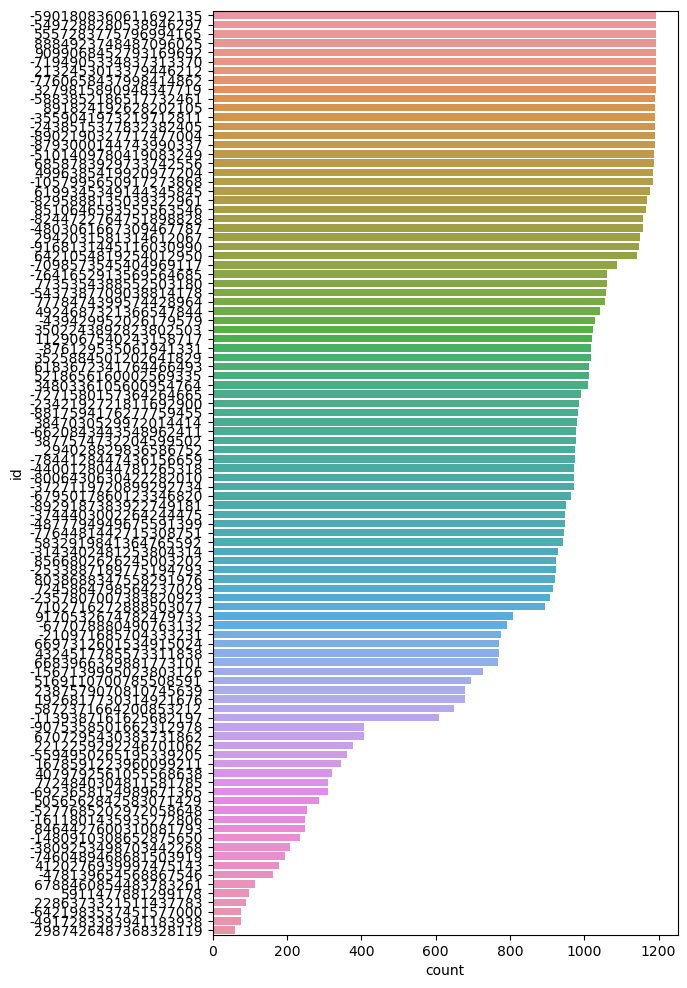

In [16]:
_, ax = plt.subplots(figsize=(6, 12))
sns.barplot(data=df_id, x='count', y='id', ax=ax)

As we can see, some point of sales are less represented in the dataset than others. We check the dates available in the data to understand why:

In [17]:
id_less = df_id.iloc[-1]["id"]
df[df["id"] == id_less]

,Date,Fourni,Ventes,id
46,2020-01-02,9.0,4.0,2987426487368328119
145,2020-01-03,10.0,4.0,2987426487368328119
242,2020-01-04,10.0,2.0,2987426487368328119
327,2020-01-05,13.0,5.0,2987426487368328119
410,2020-01-06,10.0,5.0,2987426487368328119
500,2020-01-07,10.0,6.0,2987426487368328119
589,2020-01-08,11.0,4.0,2987426487368328119
679,2020-01-09,9.0,3.0,2987426487368328119
776,2020-01-10,10.0,3.0,2987426487368328119
871,2020-01-11,10.0,5.0,2987426487368328119


As we can see, this point of sell closed just before covid and never opened after. On the contrary, some ids have 1192 rows which correspond to the number of unique dates so they were opened during the all period covered by the dataset.

We get some info from the date feature

In [18]:
df = df.pipe(extract_date_features, feat_date=feat_date)\
    .pipe(add_lockdown_periods, feat_date=feat_date)\
    .pipe(add_holidays_period, feat_date=feat_date, zone="Zone A")\
    .pipe(add_holidays_period, feat_date=feat_date, zone="Zone B")\
    .pipe(add_holidays_period, feat_date=feat_date, zone="Zone C")

In [19]:
# Check the influence of the weekend
df.groupby(f"{feat_date}_weekend")["Ventes"].mean()

Date_weekend
0     8.828622
1    13.832440
Name: Ventes, dtype: float64

In [20]:
# Check the influence of the weekday
df.groupby(f"{feat_date}_weekday")["Ventes"].mean()

Date_weekday
0     9.558567
1     8.801954
2     8.436226
3     8.762616
4     8.637141
5    15.294355
6    11.941845
Name: Ventes, dtype: float64

On average, the number of sales is greater during weekend, and more precisely on Saturday.

In [21]:
# Check the influence of the month
df.groupby(f"{feat_date}_month")["Ventes"].mean()

Date_month
1      9.974519
2     11.423368
3     10.053332
4     10.678943
5     10.441460
6      9.892739
7      9.935827
8     10.429542
9      9.429382
10     9.718072
11     9.930351
12     9.930900
Name: Ventes, dtype: float64

On average, the daily sales per month is quite constant, with a small peak during february.

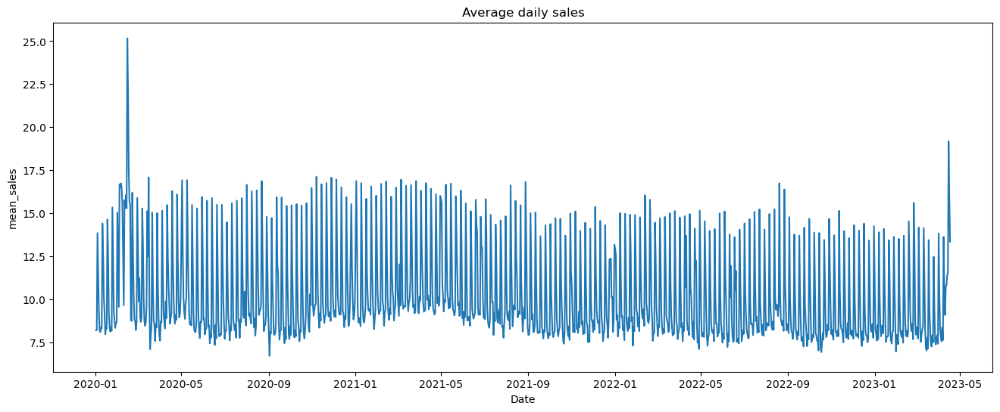

In [22]:
df_mean_by_date = df.groupby(feat_date)["Ventes"].mean().reset_index(drop=False)
df_mean_by_date.columns = ["Date", "mean_sales"]

_, ax = plt.subplots(figsize=(16, 6))
ax.set_title("Average daily sales")
sns.lineplot(data=df_mean_by_date, x="Date", y="mean_sales", ax=ax)
plt.show()

We can see that the overall tendency of the daily sales is decreasing with a peak in february 2020.

In [23]:
px.line(df.sort_values(["id", feat_date]), x=feat_date, y="Ventes", color='id', title = "Daily sales by store", height=900)

Some stores have higher daily sales in average than others

In [24]:
px.box(df, x=f"{feat_date}_year", y="Ventes" , color=f"{feat_date}_month", title="Daily sales by month and by year")

The peak is confirmed in february 2020. This might be explained by the spread of the covid at this period.

In [25]:
px.box(df, x=f"id", y="Ventes" , color=f"id", title="Daily sales by Id", height=700)

As we can see, one store has higher sales than the others.
We check the top 10 sellers to see their behavior

In [26]:
list_top10_sellers = df.sort_values(by="Ventes", ascending=False).drop_duplicates(subset="id").iloc[:10]["id"]
list_top10_sellers

3996     -8295888135039322961
20322    -4803061667309467787
3991      8884923748487096025
4169      1926817730314921676
31729    -1057995650917273868
4018     -5101409780419083249
3960     -2342192721811692900
28728     8510646593555563546
10037     6858783929733742556
2733     -2357807007383820923
Name: id, dtype: object

In [27]:
px.line(df[df["id"].isin(list_top10_sellers)].sort_values(["id", feat_date]), x=feat_date, y="Ventes", color='id', title = "Daily sales of the top 10 store", height=900)

For the top sale store, we see 3 big peaks on February 6th and 15th, and August 27th for the top seller. We also see a peak on Sept, 14th for id -4803061667309467787.

Let's check around theses dates the number of sales and and newspapers delivered.

In [28]:
dates_peak = [
    datetime.date(2020, 2, 5), datetime.date(2020, 2, 6), datetime.date(2020, 2, 7),
    datetime.date(2020, 2, 14), datetime.date(2020, 2, 15), datetime.date(2020, 2, 16),
    datetime.date(2022, 8, 26), datetime.date(2022, 8, 27), datetime.date(2022, 8, 29)
]
df[(df["id"] == list_top10_sellers.values[0]) & (df[feat_date].isin(dates_peak))]

,Date,Fourni,Ventes,id,Date_year,Date_month,Date_day,Date_weekday,Date_weekend,lockdown,Description_ZoneA,Description_ZoneB,Description_ZoneC
3093,2020-02-05,180.0,171.0,-8295888135039322961,2020,2,5,2,0,0,None,None,None
3185,2020-02-06,200.0,200.0,-8295888135039322961,2020,2,6,3,0,0,None,None,None
3282,2020-02-07,160.0,147.0,-8295888135039322961,2020,2,7,4,0,0,None,None,None
3903,2020-02-14,160.0,151.0,-8295888135039322961,2020,2,14,4,0,0,None,None,Vacances d'Hiver
3996,2020-02-15,250.0,227.0,-8295888135039322961,2020,2,15,5,1,0,None,Vacances d'Hiver,Vacances d'Hiver
4075,2020-02-16,150.0,126.0,-8295888135039322961,2020,2,16,6,1,0,None,Vacances d'Hiver,Vacances d'Hiver
68229,2022-08-26,85.0,57.0,-8295888135039322961,2022,8,26,4,0,0,Vacances d'Été,Vacances d'Été,Vacances d'Été
68291,2022-08-27,160.0,160.0,-8295888135039322961,2022,8,27,5,1,0,Vacances d'Été,Vacances d'Été,Vacances d'Été
68396,2022-08-29,95.0,73.0,-8295888135039322961,2022,8,29,0,0,0,Vacances d'Été,Vacances d'Été,Vacances d'Été


In [29]:
dates_peak = [
    datetime.date(2020, 9, 11), datetime.date(2020, 9, 12),
    datetime.date(2020, 9, 13), datetime.date(2020, 9, 14), datetime.date(2020, 9, 15),
    datetime.date(2020, 9, 16), datetime.date(2020, 9, 17),
]
df[(df["id"] == "-4803061667309467787") & (df[feat_date].isin(dates_peak))]

,Date,Fourni,Ventes,id,Date_year,Date_month,Date_day,Date_weekday,Date_weekend,lockdown,Description_ZoneA,Description_ZoneB,Description_ZoneC
20097,2020-09-11,15.0,15.0,-4803061667309467787,2020,9,11,4,0,0,None,None,None
20181,2020-09-12,25.0,16.0,-4803061667309467787,2020,9,12,5,1,0,None,None,None
20257,2020-09-13,25.0,10.0,-4803061667309467787,2020,9,13,6,1,0,None,None,None
20322,2020-09-14,120.0,120.0,-4803061667309467787,2020,9,14,0,0,0,None,None,None
20395,2020-09-15,20.0,9.0,-4803061667309467787,2020,9,15,1,0,0,None,None,None
20476,2020-09-16,20.0,6.0,-4803061667309467787,2020,9,16,2,0,0,None,None,None
20551,2020-09-17,20.0,7.0,-4803061667309467787,2020,9,17,3,0,0,None,None,None


Nothing seems to indicate a big sell for this specific day of September 14th. This might be explained by the news.